In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip "/content/drive/MyDrive/plant.zip" -d "/content/plant_data"

Streaming output truncated to the last 5000 lines.
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (415).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (416).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (417).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (418).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (419).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (42).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (420).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (421).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (422).jpg  
  inflating: /content/plant_data/plant/Images/Plan

In [3]:
import os
import shutil
import hashlib
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.layers import (GlobalAveragePooling2D, Dense, Dropout, BatchNormalization)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras import Sequential as KSequential
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast, RandomTranslation, RandomBrightness
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.regularizers import l2
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import cv2
from tensorflow.keras.applications.convnext import preprocess_input
from tensorflow.keras import Model
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import ConvNeXtBase
from sklearn.utils.class_weight import compute_class_weight
import pandas as pd
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from math import pi
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc




In [4]:

# Configuration

MAIN_DATA_DIR = '/content/plant_data/plant'
IMG_SIZE = 320
BATCH_SIZE = 32
EPOCHS_TOP = 20       # Stage 1: train top layers only
EPOCHS_FINE = 20      # Stage 2: fine-tune backbone
CONFIDENCE_THRESHOLD = 0.7
AUTOTUNE = tf.data.AUTOTUNE

In [5]:


# Data Cleaning Functions

def find_and_remove_corrupted_images(directory):
    if not os.path.exists(directory):
        print(f"Directory not found: {directory}")
        return

    print(f"Checking for corrupted images in: {directory}")
    corrupted_count = 0
    total_count = 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                total_count += 1
                file_path = os.path.join(root, file)
                try:
                    with Image.open(file_path) as img:
                        img.verify()
                except (IOError, SyntaxError):
                    print(f"Deleting corrupted image: {file_path}")
                    os.remove(file_path)
                    corrupted_count += 1

    print(f"Removed {corrupted_count} corrupted images out of {total_count}")


def remove_duplicate_images(directory):
    print(f"Removing duplicates in: {directory}")
    hashes = {}
    duplicate_count = 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                file_path = os.path.join(root, file)
                with open(file_path, "rb") as f:
                    file_hash = hashlib.md5(f.read()).hexdigest()
                if file_hash in hashes:
                    os.remove(file_path)
                    duplicate_count += 1
                else:
                    hashes[file_hash] = file_path

    print(f"Removed {duplicate_count} duplicate images")


# Clean datasets
for subdir in ["/content/plant_data/plant/Images/Plant Name", "/content/plant_data/plant/Images/Plant Species", "/content/plant_data/plant/Images/Plant Organ Type", "/content/plant_data/plant/Images/Plant Health", "/content/plant_data/plant/Images/Edibility"]:
    full_dir = os.path.join(MAIN_DATA_DIR, subdir)
    find_and_remove_corrupted_images(full_dir)
    remove_duplicate_images(full_dir)

Checking for corrupted images in: /content/plant_data/plant/Images/Plant Name
Removed 0 corrupted images out of 18194
Removing duplicates in: /content/plant_data/plant/Images/Plant Name
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Plant Species
Removed 0 corrupted images out of 18194
Removing duplicates in: /content/plant_data/plant/Images/Plant Species
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Plant Organ Type
Removed 0 corrupted images out of 18194
Removing duplicates in: /content/plant_data/plant/Images/Plant Organ Type
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Plant Health
Removed 0 corrupted images out of 18194
Removing duplicates in: /content/plant_data/plant/Images/Plant Health
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Edibility
Removed 0 corrupted images out of 18194
Removing 


--- Loading Plant Name Dataset ---
Found 18194 files belonging to 26 classes.
Using 14556 files for training.
Found 18194 files belonging to 26 classes.
Using 3638 files for validation.
Plant Name Classes: ['Alovera', 'Apple', 'Begonia', 'Calla_lily', 'Daisy', 'Dendelion', 'Dhalia', 'Grape', 'Iris', 'Jasmine', 'Lavender', 'Lotus', 'Mango', 'Merigold', 'Orcid', 'Poppy', 'Potato', 'Respberry', 'Rose', 'Snack_plant', 'Spider_plant', 'Strawberry', 'Sunflower', 'Tomato', 'Tulip', 'Tulsi']

--- Loading Plant Species Dataset ---
Found 18194 files belonging to 26 classes.
Using 14556 files for training.
Found 18194 files belonging to 26 classes.
Using 3638 files for validation.
Plant Species Classes: ['Aloe barbadensis miller', 'Begonia spp', 'Bellis perennis', 'Chlorophytum comosum', 'Dahlia pinnata', 'Dracaena trifasciata', 'Fragaria × ananassa', 'Helianthus annuus', 'Iris germanica', 'Jasminum sambac', 'Lavandula angustifolia', 'Malus domestica', 'Mangifera indica', 'Nelumbo nucifera', 'Oc

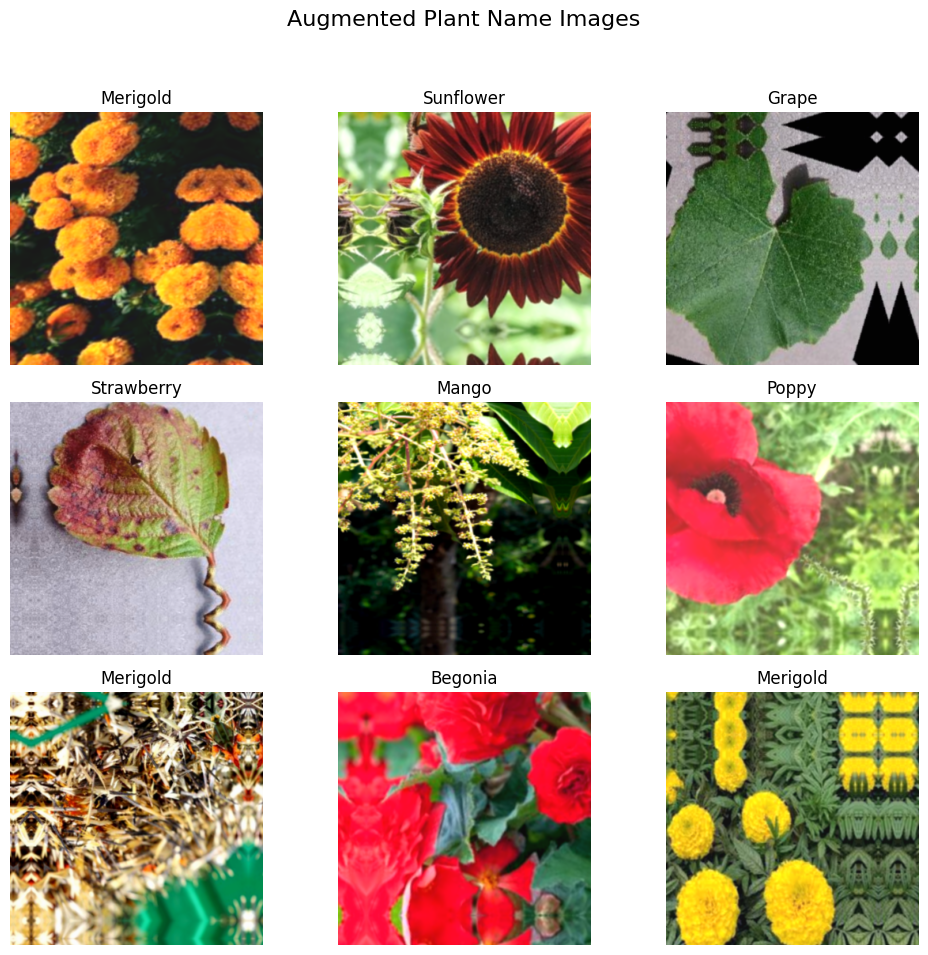

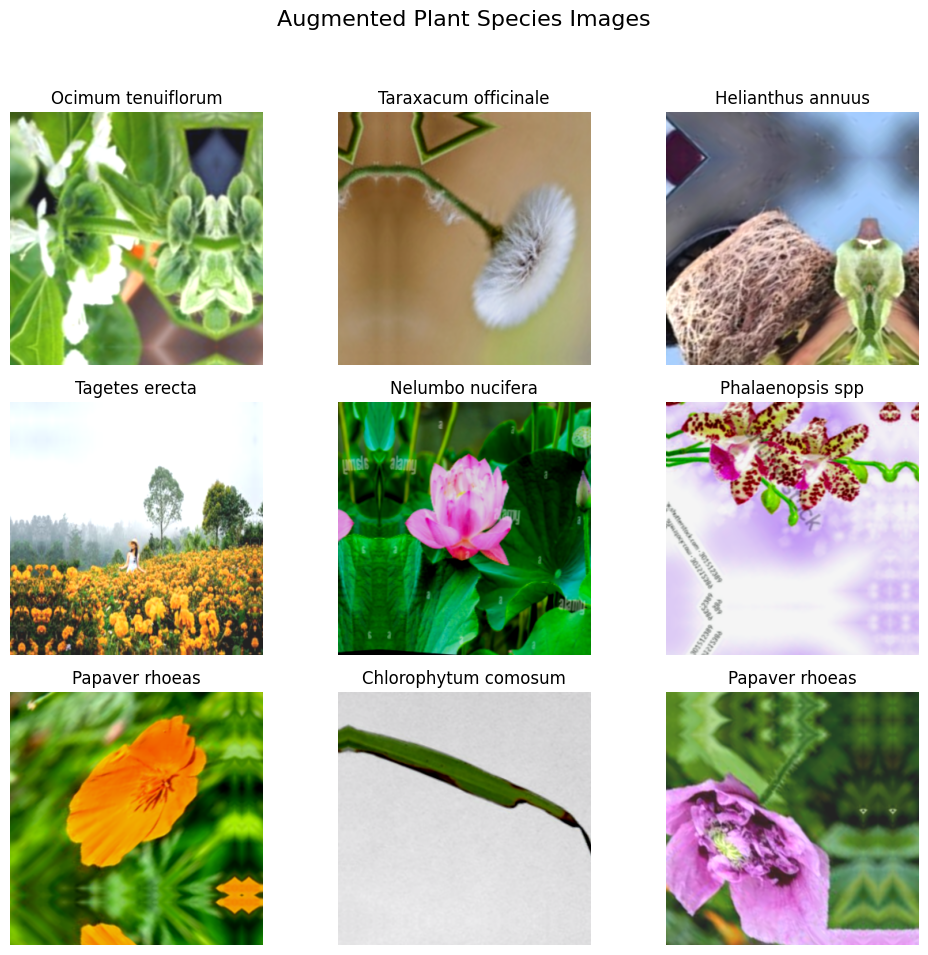

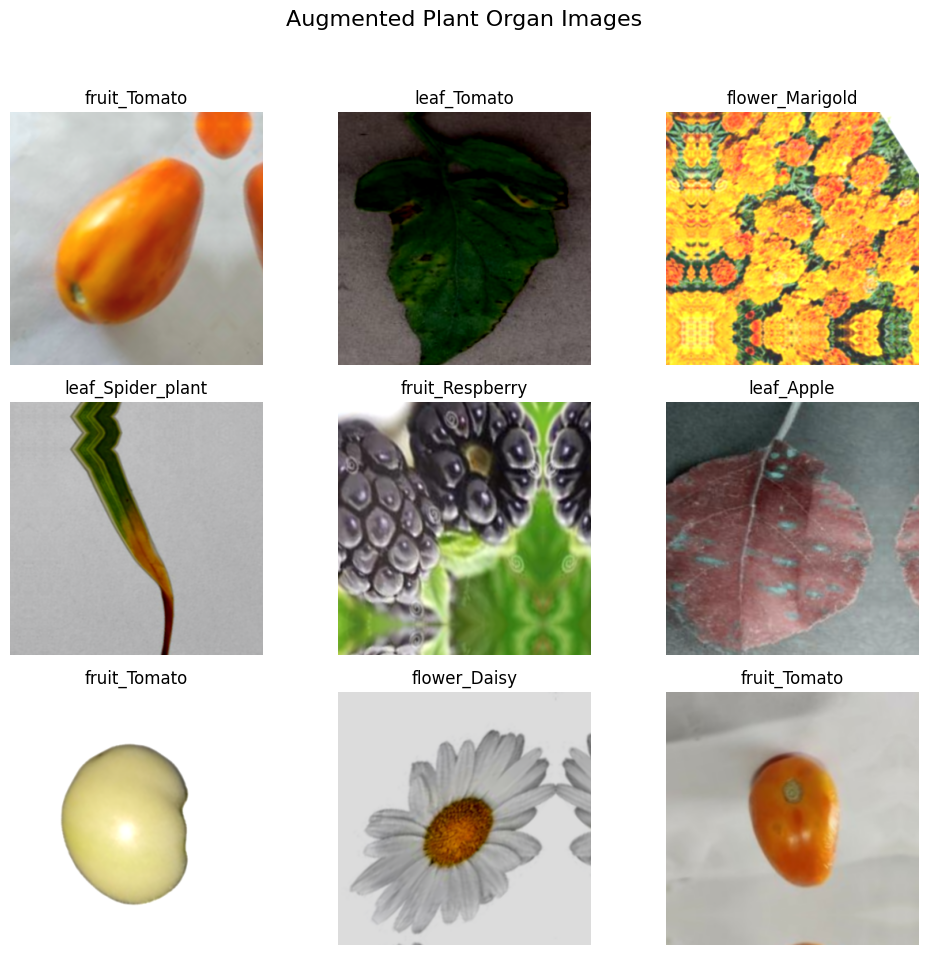

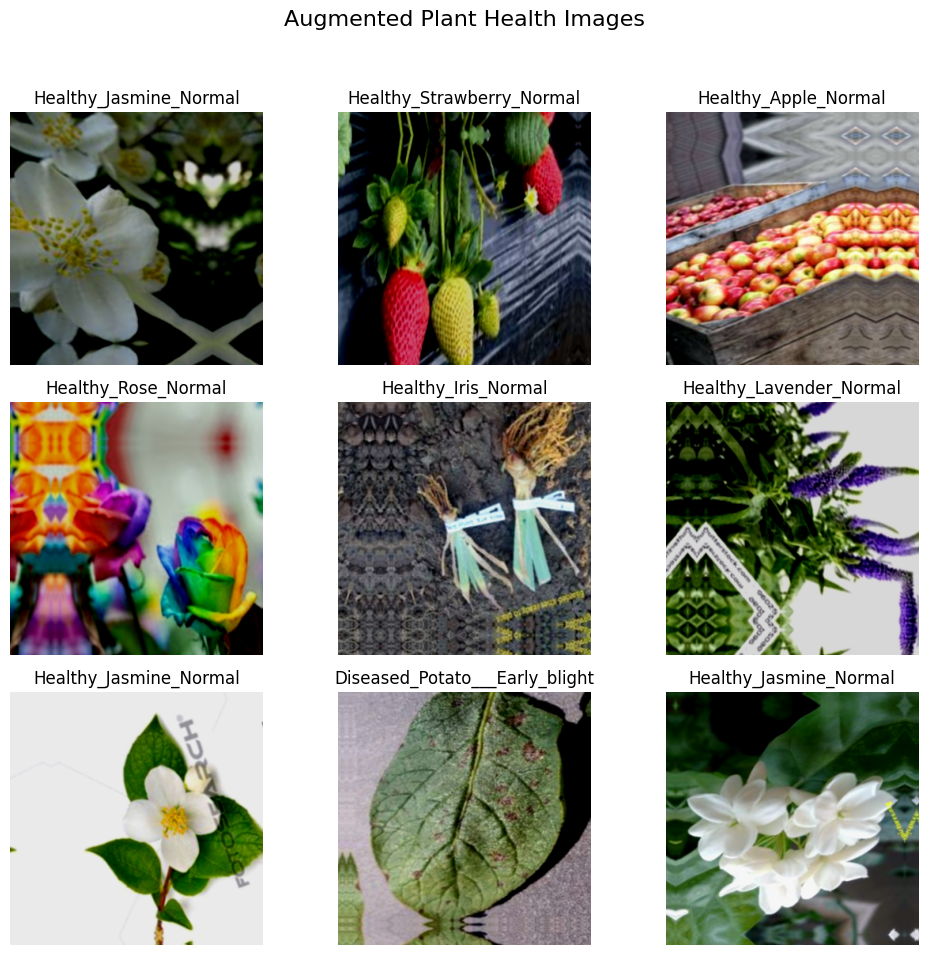

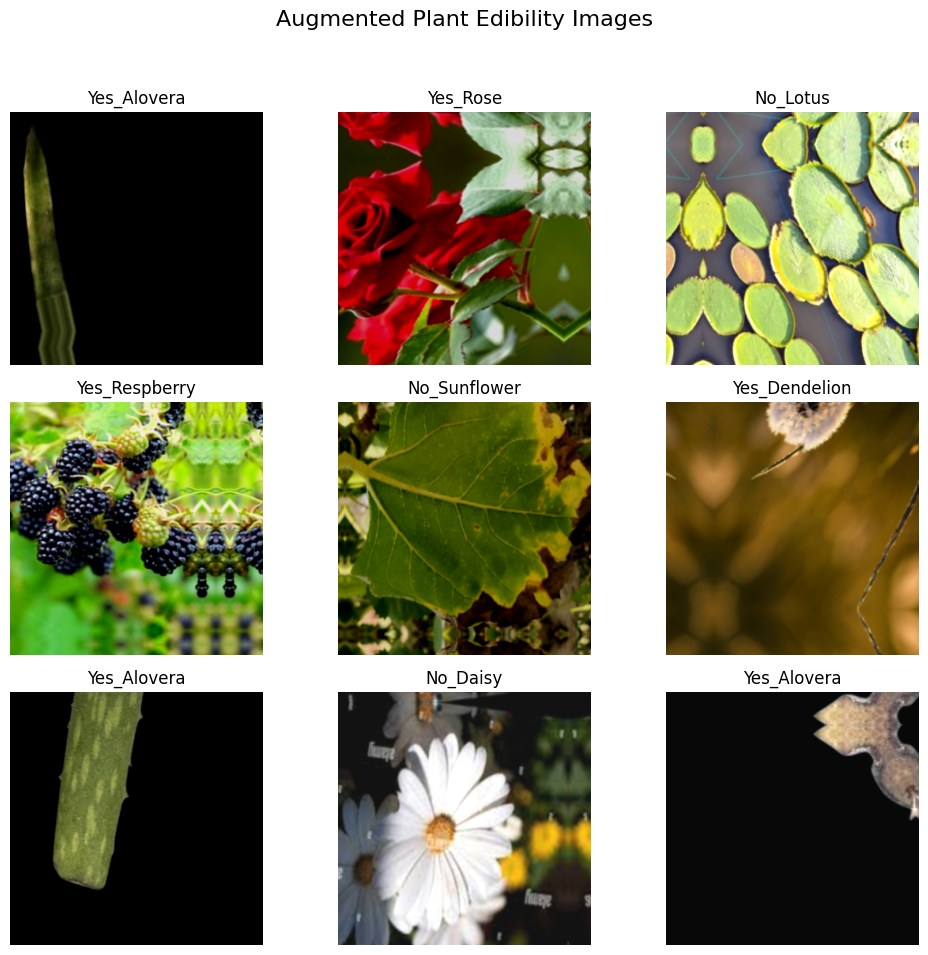

In [6]:

# --- Data Augmentation Layer ---
data_augmentation = KSequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomContrast(0.3),
    RandomTranslation(height_factor=0.2, width_factor=0.2),
    RandomBrightness(0.2)
])

# --- Utility function for visualization ---
def visualize_dataset(dataset, class_names, title):
    plt.figure(figsize=(10,10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3,3,i+1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(f"{class_names[labels[i]]}")
            plt.axis("off")
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0,0.03,1,0.95])
    plt.show()

# ==============================
# --- Plant Name Dataset ---
# ==============================
print("\n--- Loading Plant Name Dataset ---")
train_plant_name_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Name"),
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_name_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Name"),
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_names = train_plant_name_ds.class_names
print(f"Plant Name Classes: {plant_names}")

train_plant_name_ds = train_plant_name_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_name_ds = val_plant_name_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Species Dataset ---
# ==============================
print("\n--- Loading Plant Species Dataset ---")
train_plant_species_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Species"),
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_species_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Species"),
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_species = train_plant_species_ds.class_names
print(f"Plant Species Classes: {plant_species}")

train_plant_species_ds = train_plant_species_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_species_ds = val_plant_species_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Organ Dataset ---
# ==============================
print("\n--- Loading Plant Organ Dataset ---")
plant_organ_tmp_dir = 'tmp_plant_organ_dataset'
if os.path.exists(plant_organ_tmp_dir):
    shutil.rmtree(plant_organ_tmp_dir)
os.makedirs(plant_organ_tmp_dir)

for organ in os.listdir(os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Organ Type")):
    organ_path = os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Organ Type", organ)
    if os.path.isdir(organ_path):
        for plant in os.listdir(organ_path):
            plant_path = os.path.join(organ_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{organ}_{plant}"
                new_class_path = os.path.join(plant_organ_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_organ_ds = tf.keras.utils.image_dataset_from_directory(
    plant_organ_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_organ_ds = tf.keras.utils.image_dataset_from_directory(
    plant_organ_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_organs = train_plant_organ_ds.class_names
print(f"Plant Organ Classes: {plant_organs}")

train_plant_organ_ds = train_plant_organ_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_organ_ds = val_plant_organ_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Health Dataset ---
# ==============================
print("\n--- Loading Plant Health Dataset ---")
plant_health_tmp_dir = 'tmp_plant_health_dataset'
if os.path.exists(plant_health_tmp_dir):
    shutil.rmtree(plant_health_tmp_dir)
os.makedirs(plant_health_tmp_dir)

for health in os.listdir(os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Health")):
    health_path = os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Health", health)
    if os.path.isdir(health_path):
        for plant in os.listdir(health_path):
            plant_path = os.path.join(health_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{health}_{plant}"
                new_class_path = os.path.join(plant_health_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_health_ds = tf.keras.utils.image_dataset_from_directory(
    plant_health_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_health_ds = tf.keras.utils.image_dataset_from_directory(
    plant_health_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_health = train_plant_health_ds.class_names
print(f"Plant Health Classes: {plant_health}")

train_plant_health_ds = train_plant_health_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_health_ds = val_plant_health_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Edibility Dataset ---
# ==============================
print("\n--- Loading Plant Edibility Dataset ---")
plant_edibility_tmp_dir = 'tmp_plant_edibility_dataset'
if os.path.exists(plant_edibility_tmp_dir):
    shutil.rmtree(plant_edibility_tmp_dir)
os.makedirs(plant_edibility_tmp_dir)

for edibility in os.listdir(os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Edibility")):
    edibility_path = os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Edibility", edibility)
    if os.path.isdir(edibility_path):
        for plant in os.listdir(edibility_path):
            plant_path = os.path.join(edibility_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{edibility}_{plant}"
                new_class_path = os.path.join(plant_edibility_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_edibility_ds = tf.keras.utils.image_dataset_from_directory(
    plant_edibility_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_edibility_ds = tf.keras.utils.image_dataset_from_directory(
    plant_edibility_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_edibility = train_plant_edibility_ds.class_names
print(f"Plant Edibility Classes: {plant_edibility}")

train_plant_edibility_ds = train_plant_edibility_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_edibility_ds = val_plant_edibility_ds.prefetch(buffer_size=AUTOTUNE)



# ==============================
# --- Visualizations for all
# ==============================
visualize_dataset(train_plant_name_ds, plant_names, "Augmented Plant Name Images")
visualize_dataset(train_plant_species_ds, plant_species, "Augmented Plant Species Images")
visualize_dataset(train_plant_organ_ds, plant_organs, "Augmented Plant Organ Images")
visualize_dataset(train_plant_health_ds, plant_health, "Augmented Plant Health Images")
visualize_dataset(train_plant_edibility_ds, plant_edibility, "Augmented Plant Edibility Images")



In [7]:
# =========================
# BUILD MODEL FUNCTION
# =========================
def build_model(input_shape, num_classes, data_augmentation):
    base_model = ConvNeXtBase(
        include_top=False,
        weights="imagenet",
        input_shape=input_shape
    )
    base_model.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(512, activation="relu")(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = Model(inputs, outputs)
    return model


# =========================
# CALLBACKS FUNCTION
# =========================
def get_callbacks(model_name):
    return [
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose=1),
        ModelCheckpoint(f'{model_name}.keras', monitor='val_accuracy', save_best_only=True, verbose=1)
    ]


# =========================
# TRAIN MODEL FUNCTION
# =========================
def train_model(train_ds, val_ds, classes, model_name, img_size, data_augmentation):
    print(f"\n=== Training {model_name} Model ===")
    input_shape = (img_size, img_size, 3)
    num_classes = len(classes)

    # Build model
    model = build_model(input_shape, num_classes, data_augmentation)
    model.summary()

    # Compile model for stage 1
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    # Prefetch datasets
    train_ds_prefetch = train_ds.prefetch(AUTOTUNE)
    val_ds_prefetch = val_ds.prefetch(AUTOTUNE)

    # =========================
    # Stage 1: Train top layers only
    # =========================
    print(f"\n--- Stage 1: Training top layers only for {model_name} ---")
    history_stage1 = model.fit(
        train_ds_prefetch,
        validation_data=val_ds_prefetch,
        epochs=EPOCHS_TOP,
        callbacks=get_callbacks(f"{model_name}_stage1"),
        verbose=1
    )

    # =========================
    # Stage 2: Fine-tuning last 30 layers
    # =========================
    print(f"\n--- Stage 2: Fine-tuning last 30 layers of {model_name} ---")
    base_model = model.layers[2]  # ConvNeXt backbone

    for layer in base_model.layers[:-30]:
        layer.trainable = False
    for layer in base_model.layers[-30:]:
        layer.trainable = True

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    history_stage2 = model.fit(
        train_ds_prefetch,
        validation_data=val_ds_prefetch,
        epochs=EPOCHS_FINE,
        callbacks=get_callbacks(f"{model_name}_stage2"),
        verbose=1
    )

    return model, (history_stage1, history_stage2)


# =========================
# TRAIN ALL DATASETS
# =========================
datasets = [
    (train_plant_name_ds, val_plant_name_ds, plant_names, "Plant_Name"),
    (train_plant_species_ds, val_plant_species_ds, plant_species, "Plant_Species"),
    (train_plant_organ_ds, val_plant_organ_ds, plant_organs, "Plant_Organ"),
    (train_plant_health_ds, val_plant_health_ds, plant_health, "Plant_Health"),
    (train_plant_edibility_ds, val_plant_edibility_ds, plant_edibility, "Plant_Edibility"),
]

trained_models = {}

for train_ds, val_ds, classes, name in datasets:
    model, history = train_model(train_ds, val_ds, classes, name, IMG_SIZE, data_augmentation)
    trained_models[name] = {"model": model, "history": history}

print("\nAll datasets trained successfully!")


=== Training Plant_Name Model ===
350926856/350926856 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_base (Functional)      │ (None, 10, 10, 1024)   │    87,566,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,108,698 (336.11 MB)

 Trainable params: 540,186 (2.06 MB)

 Non-trainable params: 87,568,512 (334.05 MB)


--- Stage 1: Training top layers only for Plant_Name ---
Epoch 1/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6831 - loss: 1.1956
Epoch 1: val_accuracy improved from -inf to 0.95080, saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 575s 1s/step - accuracy: 0.6834 - loss: 1.1946 - val_accuracy: 0.9508 - val_loss: 0.2075 - learning_rate: 0.0010
Epoch 2/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - accuracy: 0.8792 - loss: 0.4170
Epoch 2: val_accuracy improved from 0.95080 to 0.95574, saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 158s 343ms/step - accuracy: 0.8792 - loss: 0.4170 - val_accuracy: 0.9557 - val_loss: 0.1727 - learning_rate: 0.0010
Epoch 3/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.9044 - loss: 0.3460
Epoch 3: val_accuracy improved from 0.95574 to 0.95657, saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 111s 240ms/step - accuracy: 0.9044 - loss: 0.3460 - val_accuracy: 0.9566 - val_l

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_base (Functional)      │ (None, 10, 10, 1024)   │    87,566,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,108,698 (336.11 MB)

 Trainable params: 540,186 (2.06 MB)

 Non-trainable params: 87,568,512 (334.05 MB)


--- Stage 1: Training top layers only for Plant_Species ---
Epoch 1/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.6918 - loss: 1.1686
Epoch 1: val_accuracy improved from -inf to 0.94035, saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 173s 332ms/step - accuracy: 0.6921 - loss: 1.1676 - val_accuracy: 0.9404 - val_loss: 0.2288 - learning_rate: 0.0010
Epoch 2/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.8767 - loss: 0.4352
Epoch 2: val_accuracy improved from 0.94035 to 0.95217, saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 134s 289ms/step - accuracy: 0.8767 - loss: 0.4352 - val_accuracy: 0.9522 - val_loss: 0.1858 - learning_rate: 0.0010
Epoch 3/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.8980 - loss: 0.3252
Epoch 3: val_accuracy improved from 0.95217 to 0.95794, saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 111s 240ms/step - accuracy: 0.8980 - loss: 0.3252 - val_accura

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_base (Functional)      │ (None, 10, 10, 1024)   │    87,566,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 98)             │        50,274 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,145,634 (336.25 MB)

 Trainable params: 577,122 (2.20 MB)

 Non-trainable params: 87,568,512 (334.05 MB)


--- Stage 1: Training top layers only for Plant_Organ ---
Epoch 1/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.6738 - loss: 1.4708
Epoch 1: val_accuracy improved from -inf to 0.94612, saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 174s 332ms/step - accuracy: 0.6740 - loss: 1.4695 - val_accuracy: 0.9461 - val_loss: 0.2206 - learning_rate: 0.0010
Epoch 2/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - accuracy: 0.8900 - loss: 0.3995
Epoch 2: val_accuracy improved from 0.94612 to 0.95465, saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 158s 343ms/step - accuracy: 0.8900 - loss: 0.3994 - val_accuracy: 0.9546 - val_loss: 0.1888 - learning_rate: 0.0010
Epoch 3/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.9047 - loss: 0.3308
Epoch 3: val_accuracy improved from 0.95465 to 0.95959, saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 111s 239ms/step - accuracy: 0.9047 - loss: 0.3307 - val_accuracy: 0.95

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)     │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_base (Functional)      │ (None, 10, 10, 1024)   │    87,566,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 71)             │        36,423 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,131,783 (336.20 MB)

 Trainable params: 563,271 (2.15 MB)

 Non-trainable params: 87,568,512 (334.05 MB)


--- Stage 1: Training top layers only for Plant_Health ---
Epoch 1/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.5755 - loss: 1.7401
Epoch 1: val_accuracy improved from -inf to 0.86641, saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 173s 331ms/step - accuracy: 0.5758 - loss: 1.7388 - val_accuracy: 0.8664 - val_loss: 0.4426 - learning_rate: 0.0010
Epoch 2/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.8205 - loss: 0.6086
Epoch 2: val_accuracy improved from 0.86641 to 0.88922, saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 138s 299ms/step - accuracy: 0.8205 - loss: 0.6085 - val_accuracy: 0.8892 - val_loss: 0.3825 - learning_rate: 0.0010
Epoch 3/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.8512 - loss: 0.5060
Epoch 3: val_accuracy improved from 0.88922 to 0.89527, saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 112s 241ms/step - accuracy: 0.8512 - loss: 0.5060 - val_accuracy: 

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_30 (InputLayer)     │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 320, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_base (Functional)      │ (None, 10, 10, 1024)   │    87,566,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 41)             │        21,033 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,116,393 (336.14 MB)

 Trainable params: 547,881 (2.09 MB)

 Non-trainable params: 87,568,512 (334.05 MB)


--- Stage 1: Training top layers only for Plant_Edibility ---
Epoch 1/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 564ms/step - accuracy: 0.6689 - loss: 1.3116
Epoch 1: val_accuracy improved from -inf to 0.94695, saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 315s 645ms/step - accuracy: 0.6691 - loss: 1.3105 - val_accuracy: 0.9469 - val_loss: 0.2120 - learning_rate: 0.0010
Epoch 2/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.8774 - loss: 0.4360
Epoch 2: val_accuracy improved from 0.94695 to 0.95355, saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 138s 299ms/step - accuracy: 0.8774 - loss: 0.4359 - val_accuracy: 0.9535 - val_loss: 0.1805 - learning_rate: 0.0010
Epoch 3/20
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.8972 - loss: 0.3487
Epoch 3: val_accuracy improved from 0.95355 to 0.95739, saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 110s 239ms/step - accuracy: 0.8972 - loss: 0.3487 - va

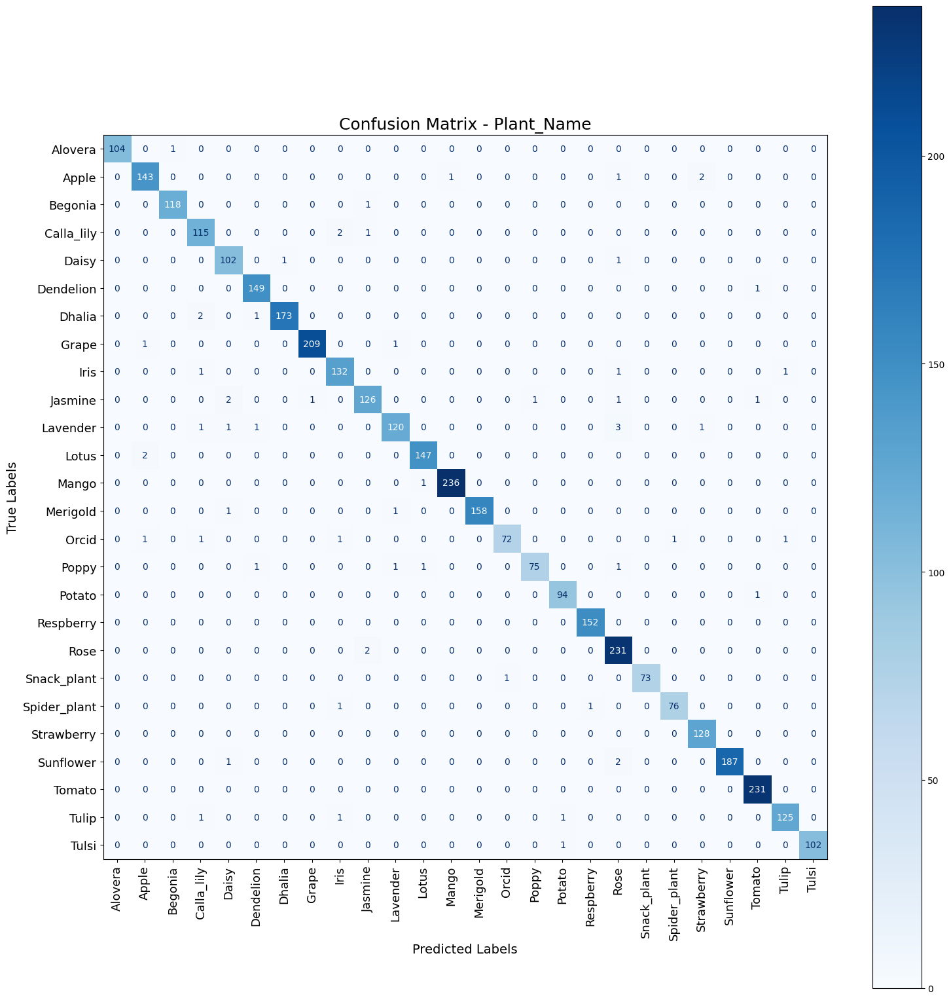


--- Classification Report: Plant_Name ---
              precision    recall  f1-score   support

     Alovera       1.00      0.99      1.00       105
       Apple       0.97      0.97      0.97       147
     Begonia       0.99      0.99      0.99       119
  Calla_lily       0.95      0.97      0.96       118
       Daisy       0.95      0.98      0.97       104
   Dendelion       0.98      0.99      0.99       150
      Dhalia       0.99      0.98      0.99       176
       Grape       1.00      0.99      0.99       211
        Iris       0.96      0.98      0.97       135
     Jasmine       0.97      0.95      0.96       132
    Lavender       0.98      0.94      0.96       127
       Lotus       0.99      0.99      0.99       149
       Mango       1.00      1.00      1.00       237
    Merigold       1.00      0.99      0.99       160
       Orcid       0.99      0.94      0.96        77
       Poppy       0.99      0.95      0.97        79
      Potato       0.98      0.99     

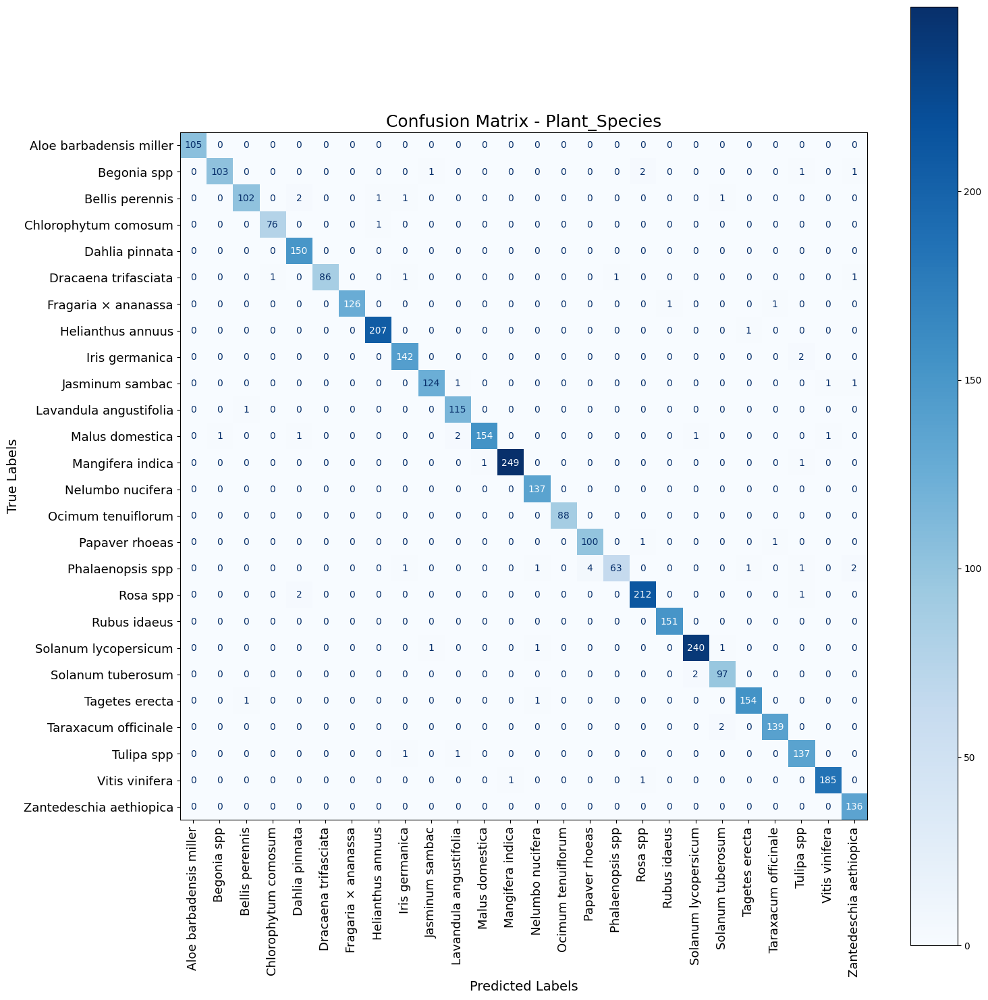


--- Classification Report: Plant_Species ---
                         precision    recall  f1-score   support

Aloe barbadensis miller       1.00      1.00      1.00       105
            Begonia spp       0.99      0.95      0.97       108
        Bellis perennis       0.98      0.95      0.97       107
   Chlorophytum comosum       0.99      0.99      0.99        77
         Dahlia pinnata       0.97      1.00      0.98       150
   Dracaena trifasciata       1.00      0.96      0.98        90
    Fragaria × ananassa       1.00      0.98      0.99       128
      Helianthus annuus       0.99      1.00      0.99       208
         Iris germanica       0.97      0.99      0.98       144
        Jasminum sambac       0.98      0.98      0.98       127
 Lavandula angustifolia       0.97      0.99      0.98       116
        Malus domestica       0.99      0.96      0.98       160
       Mangifera indica       1.00      0.99      0.99       251
       Nelumbo nucifera       0.98      1.0

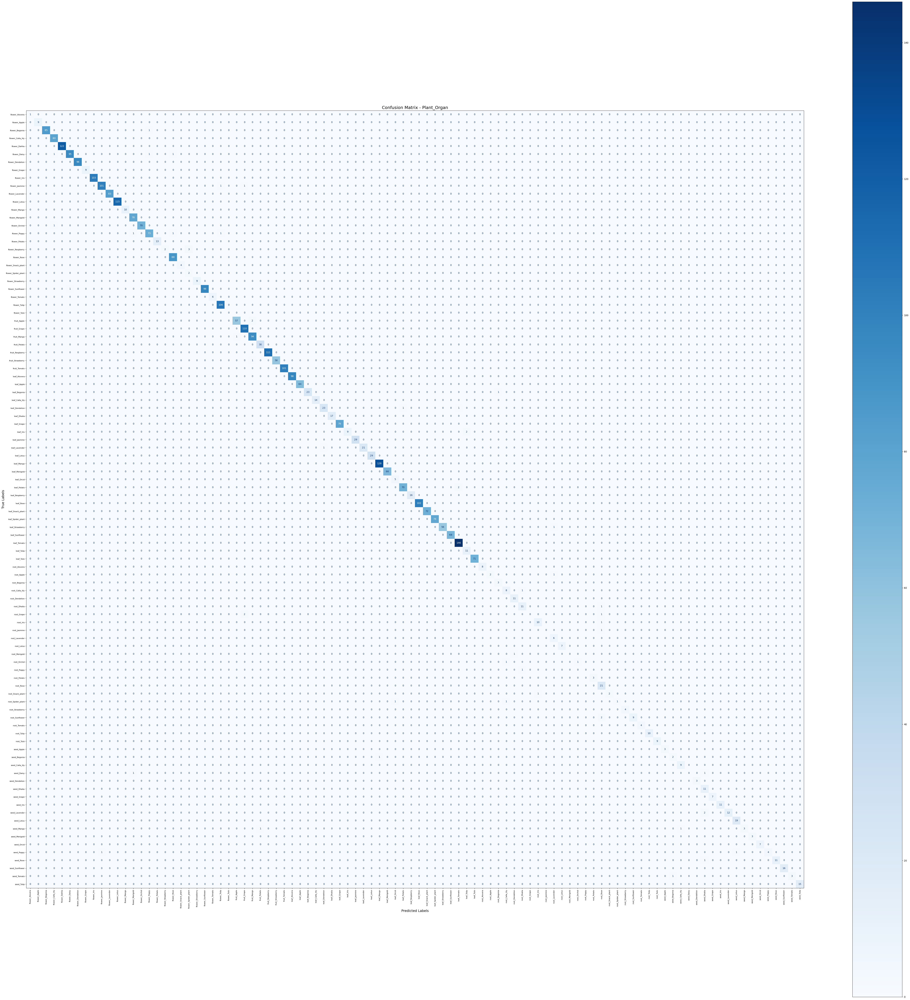


--- Classification Report: Plant_Organ ---
                     precision    recall  f1-score   support

     flower_Alovera       1.00      1.00      1.00         1
       flower_Apple       1.00      1.00      1.00         9
     flower_Begonia       1.00      0.99      0.99        86
  flower_Calla_lily       0.98      1.00      0.99        80
      flower_Dahlia       1.00      1.00      1.00       122
       flower_Daisy       0.99      0.97      0.98        98
   flower_Dendelion       1.00      1.00      1.00        96
       flower_Grape       1.00      1.00      1.00         9
        flower_Iris       1.00      1.00      1.00       103
     flower_Jasmine       0.99      0.98      0.99       103
    flower_Lavender       1.00      1.00      1.00        83
       flower_Lotus       1.00      1.00      1.00       115
       flower_Mango       1.00      1.00      1.00        10
    flower_Marigold       0.97      1.00      0.99        78
      flower_Orchid       1.00      0.99

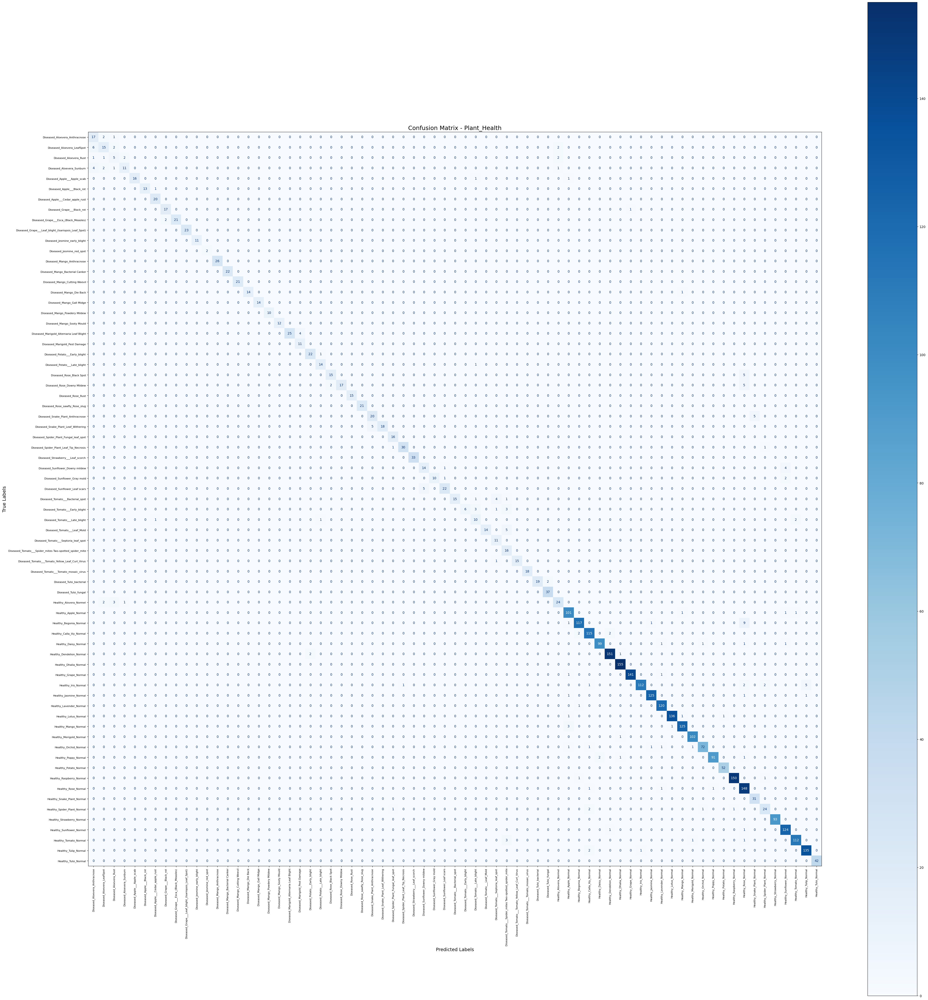


--- Classification Report: Plant_Health ---
                                                        precision    recall  f1-score   support

                         Diseased_Aloevera_Anthracnose       0.61      0.85      0.71        20
                            Diseased_Aloevera_LeafSpot       0.68      0.60      0.64        25
                                Diseased_Aloevera_Rust       0.42      0.45      0.43        11
                             Diseased_Aloevera_Sunburn       0.79      0.58      0.67        19
                           Diseased_Apple___Apple_scab       1.00      0.89      0.94        18
                            Diseased_Apple___Black_rot       1.00      0.93      0.96        14
                     Diseased_Apple___Cedar_apple_rust       0.91      1.00      0.95        20
                            Diseased_Grape___Black_rot       0.89      0.94      0.92        18
                 Diseased_Grape___Esca_(Black_Measles)       1.00      0.91      0.95     

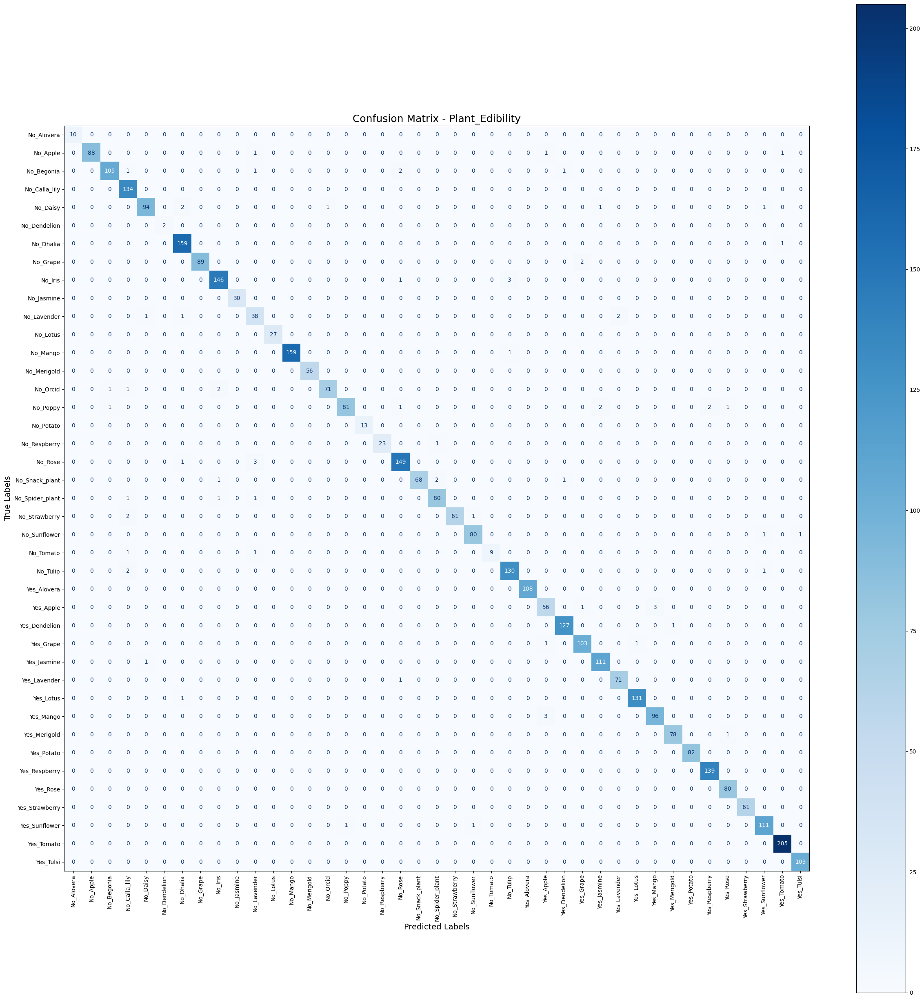


--- Classification Report: Plant_Edibility ---
                 precision    recall  f1-score   support

     No_Alovera       1.00      1.00      1.00        10
       No_Apple       1.00      0.97      0.98        91
     No_Begonia       0.98      0.95      0.97       110
  No_Calla_lily       0.94      1.00      0.97       134
       No_Daisy       0.98      0.95      0.96        99
   No_Dendelion       1.00      1.00      1.00         2
      No_Dhalia       0.97      0.99      0.98       160
       No_Grape       1.00      0.98      0.99        91
        No_Iris       0.97      0.97      0.97       150
     No_Jasmine       1.00      1.00      1.00        30
    No_Lavender       0.84      0.90      0.87        42
       No_Lotus       1.00      1.00      1.00        27
       No_Mango       1.00      0.99      1.00       160
    No_Merigold       1.00      1.00      1.00        56
       No_Orcid       0.99      0.95      0.97        75
       No_Poppy       0.99      0.92   

In [8]:


def evaluate_model(model, val_ds, class_names, title):
    val_images, val_labels = [], []

    # Collect all images and labels
    for x, y in val_ds:
        val_images.append(x.numpy())
        val_labels.append(y.numpy())
    val_images = np.concatenate(val_images)
    val_labels = np.concatenate(val_labels)

    # Predictions
    pred_labels = np.argmax(model.predict(val_images, verbose=0), axis=1)

    # Confusion matrix
    all_labels = np.arange(len(class_names))
    cm = confusion_matrix(val_labels, pred_labels, labels=all_labels)

    # ---- Adjust figure size and font based on number of classes ----
    num_classes = len(class_names)
    figsize = max(12, num_classes * 0.6)  # scale figure more aggressively for many classes
    plt.figure(figsize=(figsize, figsize))

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(
        cmap=plt.cm.Blues,
        ax=plt.gca(),
        xticks_rotation=90,
        values_format='d',
        colorbar=True
    )

    # Font scaling
    font_size = max(8, 18 - num_classes // 5)  # decrease font slightly for large number of classes
    plt.title(f'Confusion Matrix - {title}', fontsize=18)
    plt.xticks(fontsize=font_size, rotation=90)
    plt.yticks(fontsize=font_size)

    plt.xlabel("Predicted Labels", fontsize=14)
    plt.ylabel("True Labels", fontsize=14)

    plt.tight_layout()
    plt.show()

    # ---- Classification Report ----
    print(f"\n--- Classification Report: {title} ---")
    print(classification_report(
        val_labels,
        pred_labels,
        labels=all_labels,
        target_names=class_names,
        zero_division=0
    ))


# ===============================
# Evaluate ALL 5 Models Together
# ===============================
evaluation_datasets = {
    "Plant_Name": (val_plant_name_ds, plant_names),
    "Plant_Species": (val_plant_species_ds, plant_species),
    "Plant_Organ": (val_plant_organ_ds, plant_organs),
    "Plant_Health": (val_plant_health_ds, plant_health),
    "Plant_Edibility": (val_plant_edibility_ds, plant_edibility),
}

for model_name, (val_ds, class_names) in evaluation_datasets.items():
    model = trained_models[model_name]["model"]
    evaluate_model(model, val_ds, class_names, model_name)


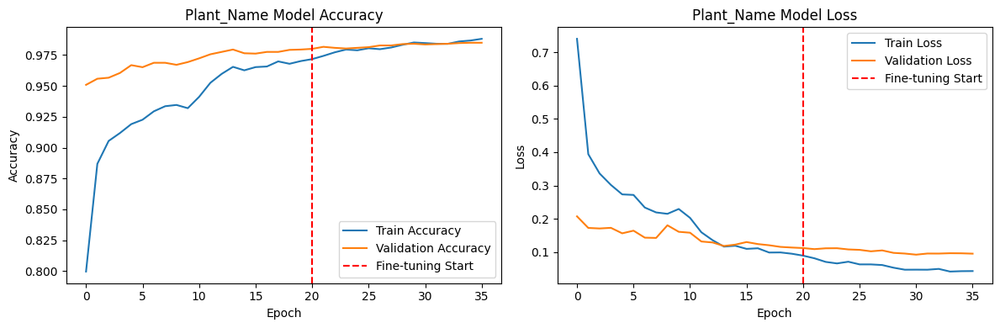

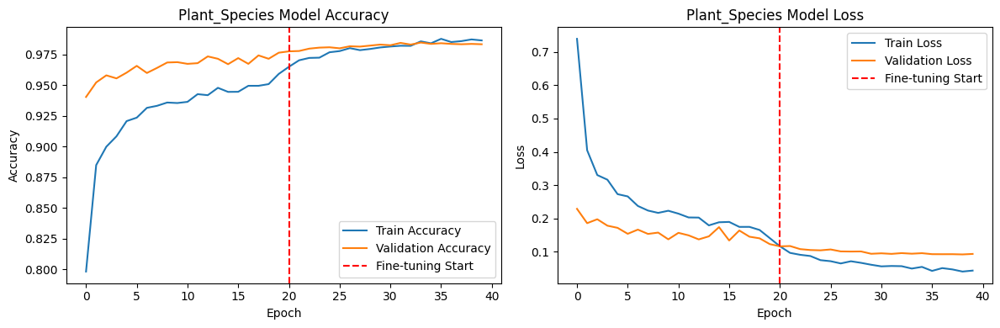

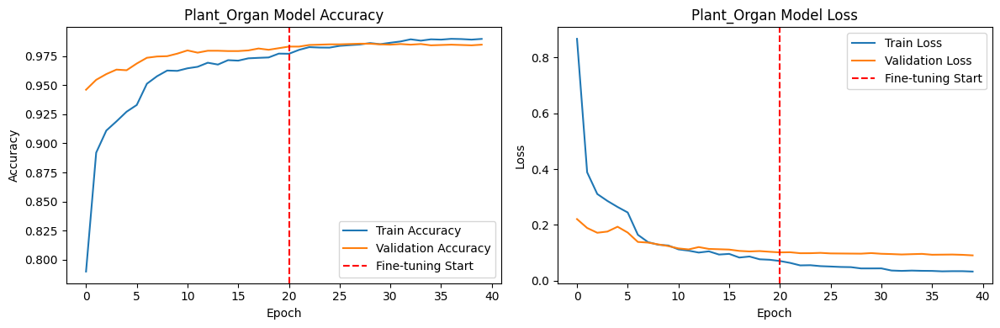

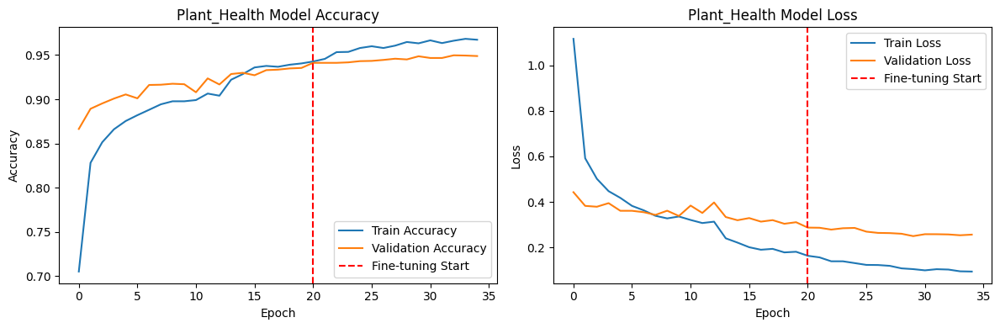

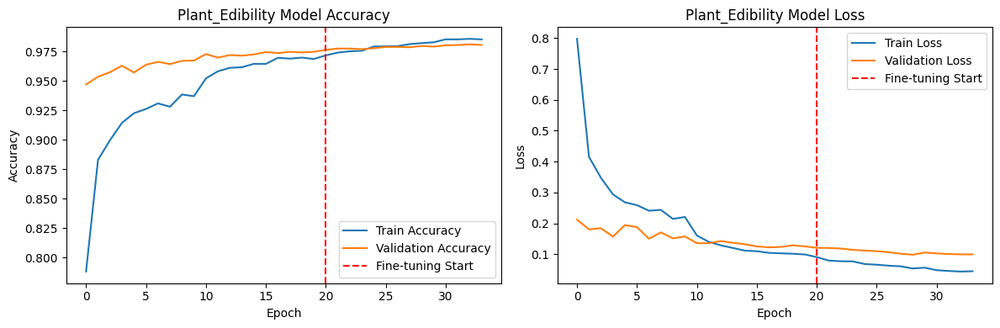

In [13]:


# -----------------------------
# Plot All 5 Models Properly
# -----------------------------

for model_name, data in trained_models.items():

    history_stage1, history_stage2 = data["history"]

    # Combine Stage 1 + Stage 2
    acc = history_stage1.history['accuracy'] + history_stage2.history['accuracy']
    val_acc = history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy']
    loss = history_stage1.history['loss'] + history_stage2.history['loss']
    val_loss = history_stage1.history['val_loss'] + history_stage2.history['val_loss']

    plt.figure(figsize=(12, 4))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Train Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')

    # Mark Fine-tuning Start
    plt.axvline(x=len(history_stage1.history['accuracy']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Train Loss')
    plt.plot(val_loss, label='Validation Loss')

    plt.axvline(x=len(history_stage1.history['loss']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()



ROC Curve: Plant_Name


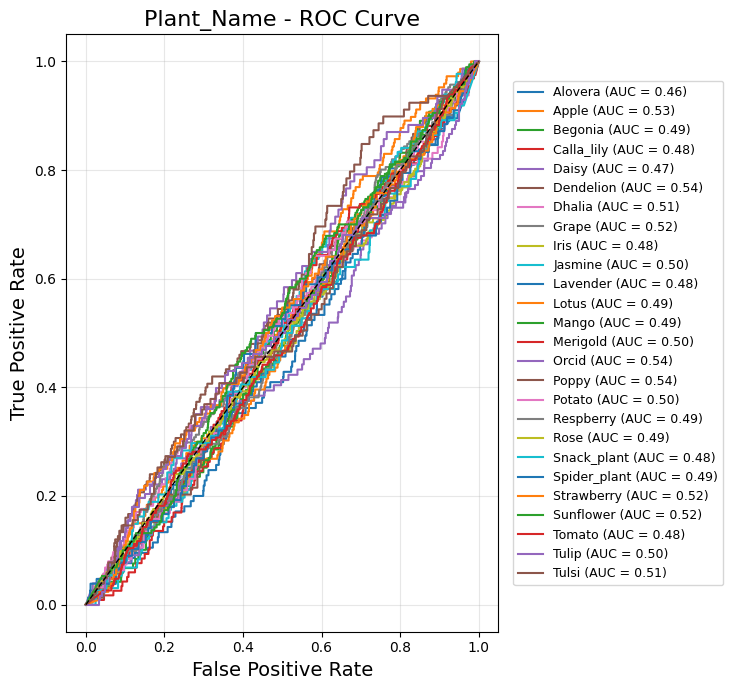


ROC Curve: Plant_Species


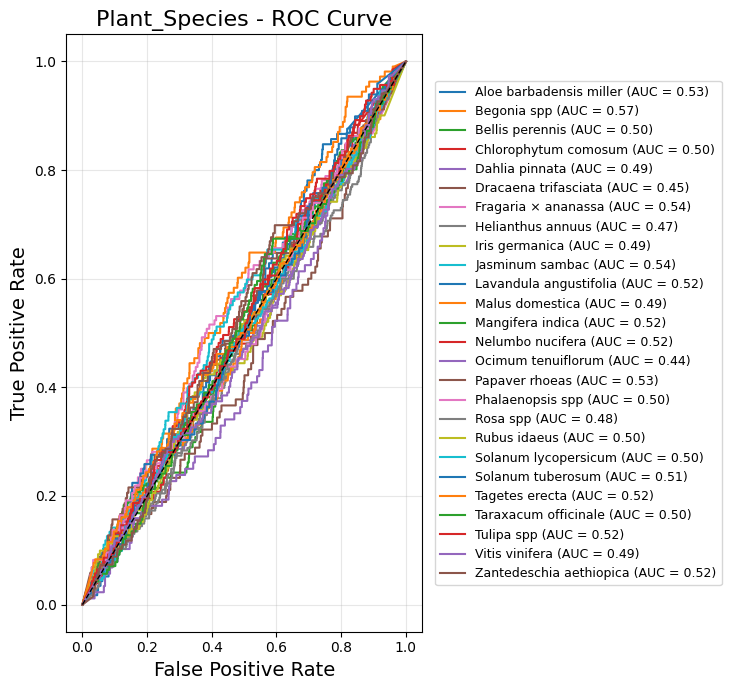


ROC Curve: Plant_Organ


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/tmp/ipython-input-1637/2978139698.py:51: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.75, 1])  # leave space on the right for legend


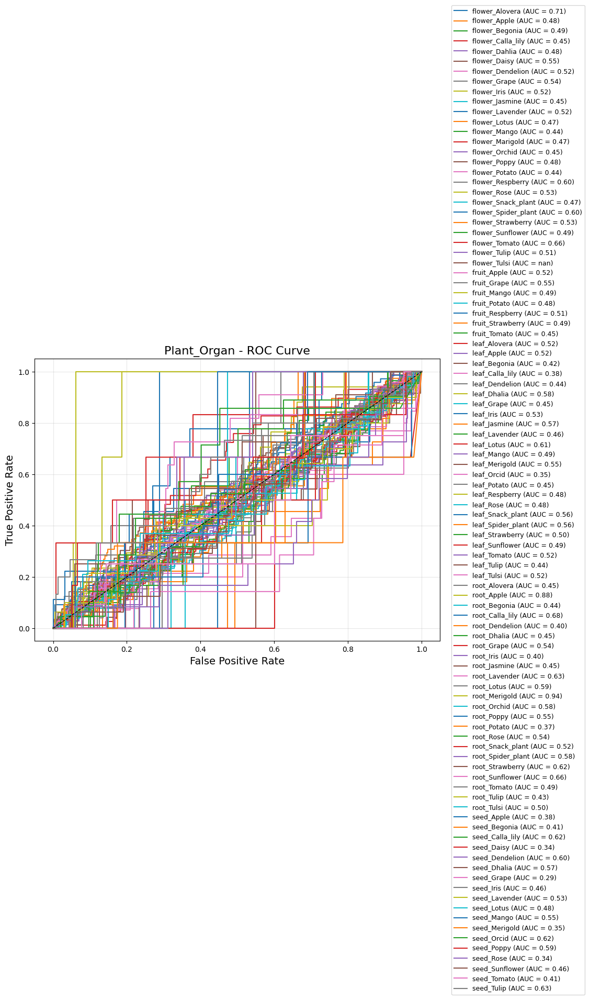


ROC Curve: Plant_Health


/tmp/ipython-input-1637/2978139698.py:51: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.75, 1])  # leave space on the right for legend


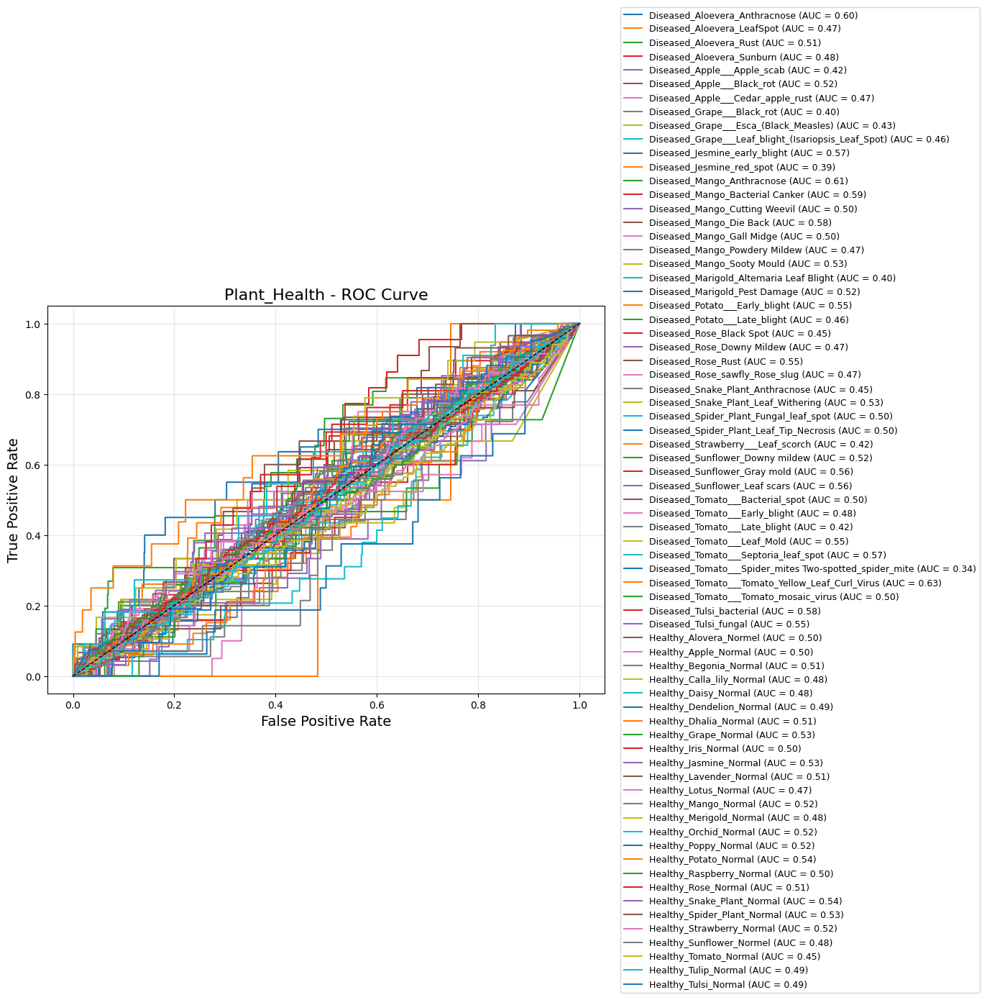


ROC Curve: Plant_Edibility


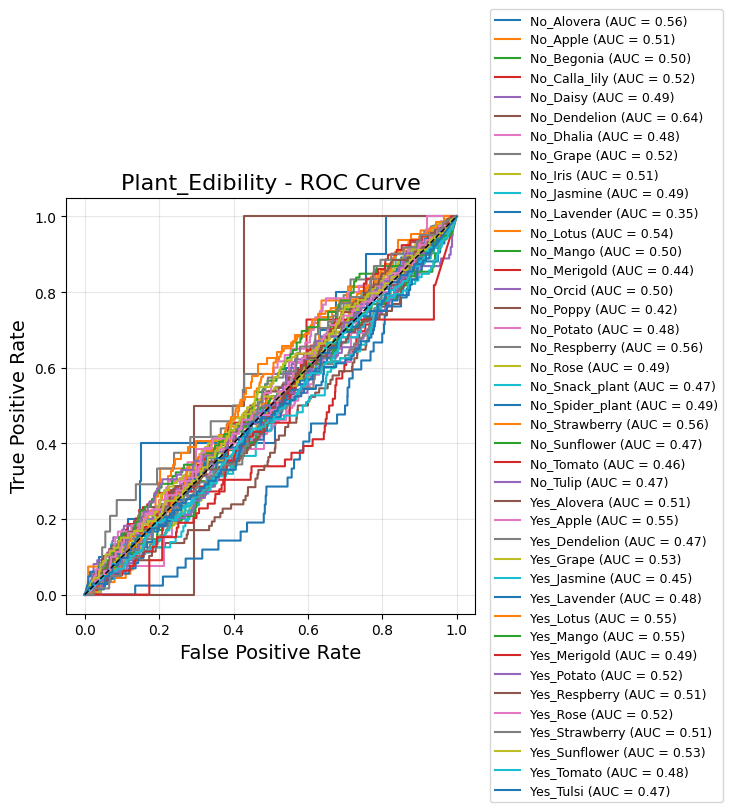

In [17]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

# -----------------------------
# Plot ROC curves for all models
# -----------------------------

# We iterate through your existing 'datasets' list to get the correct val_ds and classes
for train_ds, val_ds, class_names, model_name in datasets:

    print("\n" + "="*60)
    print(f"ROC Curve: {model_name}")
    print("="*60)

    # Grab the already-trained model from your dictionary using the model_name
    model = trained_models[model_name]["model"]

    # Collect true labels from the validation dataset
    y_true = []
    for images, labels in val_ds:
        y_true.extend(labels.numpy())
    y_true = np.array(y_true)

    # Predict probabilities
    y_pred_probs = model.predict(val_ds, verbose=0)

    n_classes = len(class_names)

    # Binarize labels for multi-class ROC
    y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

    # Plot ROC per class
    plt.figure(figsize=(10, 7))  # wider figure
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

    # Diagonal line for random guessing baseline
    plt.plot([0, 1], [0, 1], 'k--', linewidth=1)

    plt.title(f"{model_name} - ROC Curve", fontsize=16)
    plt.xlabel("False Positive Rate", fontsize=14)
    plt.ylabel("True Positive Rate", fontsize=14)
    plt.grid(alpha=0.3)

    # Place legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=9)
    plt.tight_layout(rect=[0, 0, 0.75, 1])  # leave space on the right for legend
    plt.show()

In [ ]:

# Prediction Function
def classify_image_5_models(img_path, trained_models, img_size=IMG_SIZE, confidence_threshold=CONFIDENCE_THRESHOLD):
    """
    Predict labels and confidence for all 5 plant models.
    Returns a dictionary with model_name -> (predicted_label, confidence)
    """

    # Class mapping for all 5 models
    class_mappings = {
        "Plant_Name": plant_names,
        "Plant_Species": plant_species,
        "Plant_Organ": plant_organs,
        "Plant_Health": plant_health,
        "Plant_Edibility": plant_edibility
    }

    # Check if image exists
    if not os.path.exists(img_path):
        return {model_name: ("Error: Image not found", 0.0) for model_name in class_mappings.keys()}

    # Load and preprocess image
    img = load_img(img_path, target_size=(img_size, img_size))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Dictionary to store predictions
    results = {}

    # Predict for each model
    for model_name, class_names in class_mappings.items():
        model = trained_models[model_name]["model"]

        pred_probs = model.predict(img_array, verbose=0)[0]
        conf = float(np.max(pred_probs))
        label = class_names[np.argmax(pred_probs)] if conf >= confidence_threshold else "Unknown"

        results[model_name] = (label, conf)

    return results




In [37]:
# Predict using the new 5-model function
predictions = classify_image_5_models('/content/plant_data/plant/Images/Plant Name/Rose/Downy Mildew  (10).jpg', trained_models)

# Print all results nicely
for model_name, (label, conf) in predictions.items():
    print(f"{model_name}: {label} ({conf:.2f})")


Plant_Name: Rose (1.00)
Plant_Species: Rosa spp (1.00)
Plant_Organ: leaf_Rose (1.00)
Plant_Health: Diseased_Rose_Downy Mildew (1.00)
Plant_Edibility: No_Rose (1.00)


--- Computing Summary Metrics for All Models ---
Evaluating Plant_Name...
Evaluating Plant_Species...
Evaluating Plant_Organ...
Evaluating Plant_Health...
Evaluating Plant_Edibility...

--- Model Performance Summary ---
             Model  Classes  Accuracy  Precision    Recall  F1-Score
0       Plant_Name       26  0.984882   0.984971  0.984882  0.984878
1    Plant_Species       26  0.984607   0.984799  0.984607  0.984557
2      Plant_Organ       98  0.985706   0.984907  0.985706  0.984547
3     Plant_Health       71  0.949698   0.954943  0.949698  0.949641
4  Plant_Edibility       41  0.981034   0.981364  0.981034  0.981004


/tmp/ipython-input-2636/1352145116.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x="Model", y="Accuracy", data=df_metrics, palette="viridis", ax=ax1)


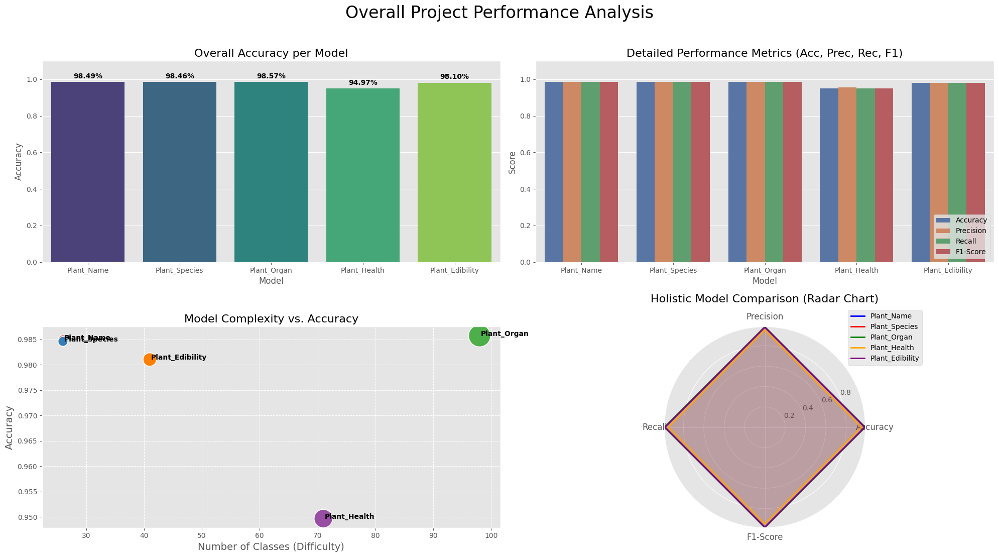

In [38]:

# ==========================================
# 1. Compute Metrics for All Models
# ==========================================
print("--- Computing Summary Metrics for All Models ---")

model_metrics = []

# Ensure evaluation_datasets is defined (from your previous step)
if 'evaluation_datasets' not in locals():
    # Re-define if missing, assuming datasets exist in memory
    evaluation_datasets = {
        "Plant_Name": (val_plant_name_ds, plant_names),
        "Plant_Species": (val_plant_species_ds, plant_species),
        "Plant_Organ": (val_plant_organ_ds, plant_organs),
        "Plant_Health": (val_plant_health_ds, plant_health),
        "Plant_Edibility": (val_plant_edibility_ds, plant_edibility),
    }

for name, (val_ds, classes) in evaluation_datasets.items():
    print(f"Evaluating {name}...")
    model = trained_models[name]["model"]

    # Get True Labels and Predictions
    y_true = []
    y_pred_probs = []

    for x, y in val_ds:
        y_true.extend(y.numpy())
        y_pred_probs.extend(model.predict(x, verbose=0))

    y_true = np.array(y_true)
    y_pred = np.argmax(y_pred_probs, axis=1)

    # Calculate Metrics (Weighted for multi-class)
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)

    model_metrics.append({
        "Model": name,
        "Classes": len(classes),
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1-Score": f1
    })

# Convert to DataFrame
df_metrics = pd.DataFrame(model_metrics)
print("\n--- Model Performance Summary ---")
print(df_metrics)


# ==========================================
# 2. Plotting the Graphs
# ==========================================
plt.style.use('ggplot')
fig = plt.figure(figsize=(20, 12))
plt.suptitle("Overall Project Performance Analysis", fontsize=24, y=0.95)

# --- Plot 1: Accuracy Comparison (Simple Bar) ---
ax1 = plt.subplot(2, 2, 1)
bars = sns.barplot(x="Model", y="Accuracy", data=df_metrics, palette="viridis", ax=ax1)
ax1.set_title("Overall Accuracy per Model", fontsize=16)
ax1.set_ylim(0, 1.1)
for i, v in enumerate(df_metrics["Accuracy"]):
    ax1.text(i, v + 0.02, f"{v:.2%}", ha='center', fontweight='bold')

# --- Plot 2: Multi-Metric Comparison (Grouped Bar) ---
ax2 = plt.subplot(2, 2, 2)
df_melted = df_metrics.melt(id_vars=["Model", "Classes"], var_name="Metric", value_name="Score")
sns.barplot(x="Model", y="Score", hue="Metric", data=df_melted, palette="deep", ax=ax2)
ax2.set_title("Detailed Performance Metrics (Acc, Prec, Rec, F1)", fontsize=16)
ax2.set_ylim(0, 1.1)
ax2.legend(loc='lower right')

# --- Plot 3: Complexity vs. Performance (Scatter/Bubble) ---
ax3 = plt.subplot(2, 2, 3)
sns.scatterplot(x="Classes", y="Accuracy", size="Classes", sizes=(200, 1000),
                hue="Model", data=df_metrics, legend=False, palette="Set1", ax=ax3)
ax3.set_title("Model Complexity vs. Accuracy", fontsize=16)
ax3.set_xlabel("Number of Classes (Difficulty)", fontsize=14)
ax3.set_ylabel("Accuracy", fontsize=14)
# Add labels to points
for line in range(0, df_metrics.shape[0]):
    ax3.text(df_metrics.Classes[line]+0.2, df_metrics.Accuracy[line],
             df_metrics.Model[line], horizontalalignment='left', size='medium', color='black', weight='semibold')
ax3.grid(True, linestyle='--')

# --- Plot 4: Radar Chart (Spider Plot) ---
ax4 = plt.subplot(2, 2, 4, polar=True)

# Prepare Data for Radar Plot
labels = ["Accuracy", "Precision", "Recall", "F1-Score"]
num_vars = len(labels)
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += [angles[0]]  # Close the loop

# Draw the chart for each model
colors = ['b', 'r', 'g', 'orange', 'purple']
for i, row in df_metrics.iterrows():
    values = row[labels].values.flatten().tolist()
    values += [values[0]]  # Close the loop

    ax4.plot(angles, values, linewidth=2, linestyle='solid', label=row["Model"], color=colors[i])
    ax4.fill(angles, values, color=colors[i], alpha=0.1)

ax4.set_xticks(angles[:-1])
ax4.set_xticklabels(labels, fontsize=12)
ax4.set_title("Holistic Model Comparison (Radar Chart)", fontsize=16, y=1.1)
ax4.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.tight_layout(rect=[0, 0.03, 1, 0.93])
plt.show()